### Libraries

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

### Load dataset

In [3]:
# Read the data from the CSV file
train_data = pd.read_csv('dataset/train.csv')

#Mapping classi to genere
genres = ['Acoustic/Folk', 'Alt Music', 'Blues', 'Bollywood', 'Country', 'HipHop', 'Indie', 'Instrumental', 'Metal', 'Pop', 'Rock']
#substituting the classi with the corresponding genre
train_data['Genre'] = train_data['Class'].map(lambda x: genres[x])
train_data.head()

,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class,Genre
0,Bruno Mars,That's What I Like (feat. Gucci Mane),60.0,0.854,0.564,1.0,-4.964,1,0.0485,0.017100,NaN,0.0849,0.8990,134.071,234596.0,4,5,HipHop
1,Boston,Hitch a Ride,54.0,0.382,0.814,3.0,-7.230,1,0.0406,0.001100,0.004010,0.1010,0.5690,116.454,251733.0,4,10,Rock
2,The Raincoats,No Side to Fall In,35.0,0.434,0.614,6.0,-8.334,1,0.0525,0.486000,0.000196,0.3940,0.7870,147.681,109667.0,4,6,Indie
3,Deno,Lingo (feat. J.I & Chunkz),66.0,0.853,0.597,10.0,-6.528,0,0.0555,0.021200,NaN,0.1220,0.5690,107.033,173968.0,4,5,HipHop
4,Red Hot Chili Peppers,Nobody Weird Like Me - Remastered,53.0,0.167,0.975,2.0,-4.279,1,0.2160,0.000169,0.016100,0.1720,0.0918,199.060,229960.0,4,10,Rock


### Handling missing values

In [25]:
# Count the missing values of each column
train_data.isnull().sum()   

Artist Name              0
Track Name               0
Popularity             428
danceability             0
energy                   0
key                   2014
loudness                 0
mode                     0
speechiness              0
acousticness             0
instrumentalness      4377
liveness                 0
valence                  0
tempo                    0
duration_in min/ms       0
time_signature           0
Class                    0
Genre                    0
dtype: int64

In [4]:
#Because the missing values are few we can fill them with 0
train_data.fillna(0,inplace=True)
train_data.isnull().sum()

Artist Name           0
Track Name            0
Popularity            0
danceability          0
energy                0
key                   0
loudness              0
mode                  0
speechiness           0
acousticness          0
instrumentalness      0
liveness              0
valence               0
tempo                 0
duration_in min/ms    0
time_signature        0
Class                 0
Genre                 0
dtype: int64

In [27]:
train_data.dtypes
train_data.columns

Index(['Artist Name', 'Track Name', 'Popularity', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_in min/ms', 'time_signature', 'Class', 'Genre'],
      dtype='object')

In [5]:
train_data = train_data[[
        'Artist Name', 'Track Name', 'Popularity', 'danceability', 'energy',
       #'key',
        'loudness',
        #'mode',
        'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 
       'valence', # ??
       'tempo',
       'duration_in min/ms', 'time_signature', 'Class','Genre']].copy()

In [13]:
train_data.rename(columns={
                           'Artist Name': 'Artist_Name',
                            'Track Name': 'Track_Name',
                            'danceability': 'Danceability',
                            'energy': 'Energy',
                            'loudness': 'Loudness',                           
                            'speechiness': 'Speechiness',
                            'acousticness': 'Acousticness',
                            'instrumentalness': 'Instrumentalness',
                            'liveness': 'Liveness',
                            'valence': 'Valence',
                            'tempo': 'Tempo_bpm',
                            'duration_in min/ms': 'Duration_ms',
                            'time_signature': 'Time_Signature',
                           }, inplace=True)
numeric_features_array = ['Popularity', 'Danceability', 'Energy', 'Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo_bpm', 'Duration_ms', 'Time_Signature']
print(train_data.columns)

Index(['Artist_Name', 'Track_Name', 'Popularity', 'Danceability', 'Energy',
       'Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness',
       'Liveness', 'Valence', 'Tempo_bpm', 'Duration_ms', 'Time_Signature',
       'Class', 'Genre'],
      dtype='object')


In [7]:
train_data.loc[train_data.duplicated()] # There are no duplicates

,Artist_Name,Track_Name,Popularity,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo_bpm,Duration_ms,Time_Signature,Class,Genre


In [8]:
train_data.loc[train_data.duplicated(subset=['Track_Name'])].head(5)

,Artist_Name,Track_Name,Popularity,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo_bpm,Duration_ms,Time_Signature,Class,Genre
350,The Cult,She Sells Sanctuary,69.0,0.550,0.765,-8.684,0.0287,0.000005,0.873000,0.1320,0.419,139.460,252533.0,4,6,Indie
463,Beck,Dreams,59.0,0.582,0.938,-5.726,0.0392,0.000733,0.020200,0.0841,0.800,113.999,314487.0,4,6,Indie
552,Elton John,"Rocket Man (I Think It's Going To Be A Long, L...",82.0,0.601,0.532,-9.119,0.0286,0.432000,0.000006,0.0925,0.341,136.571,281613.0,4,10,Rock
591,Foreign Air,Monsters,50.0,0.552,0.673,-4.900,0.0298,0.005530,0.000000,0.1140,0.174,89.993,224053.0,4,9,Pop
758,Betcha,July,55.0,0.607,0.658,-5.552,0.0262,0.010300,0.022400,0.0537,0.567,99.983,207587.0,4,10,Rock


In [9]:
train_data.query('Track_Name == "She Sells Sanctuary"')

,Artist_Name,Track_Name,Popularity,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo_bpm,Duration_ms,Time_Signature,Class,Genre
271,The Cult,She Sells Sanctuary,69.0,0.55,0.765,-8.684,0.0287,0.000005,0.873,0.132,0.419,139.46,252533.0,4,10,Rock
350,The Cult,She Sells Sanctuary,69.0,0.55,0.765,-8.684,0.0287,0.000005,0.873,0.132,0.419,139.46,252533.0,4,6,Indie


### Count duplicates

In [10]:
duplicated_tracks = train_data.drop(['Class','Genre'], axis=1)
print("Total songs : " + str(train_data['Genre'].count()) )
print("Non duplicated songs : " + str((~duplicated_tracks.duplicated()).sum()) )
print("Duplicated songs : " + str((duplicated_tracks.duplicated()).sum()) )

#Songs are duplicated to specify multiple genres

Total songs : 17996
Non duplicated songs : 16323
Duplicated songs : 1673


### Class Distribution

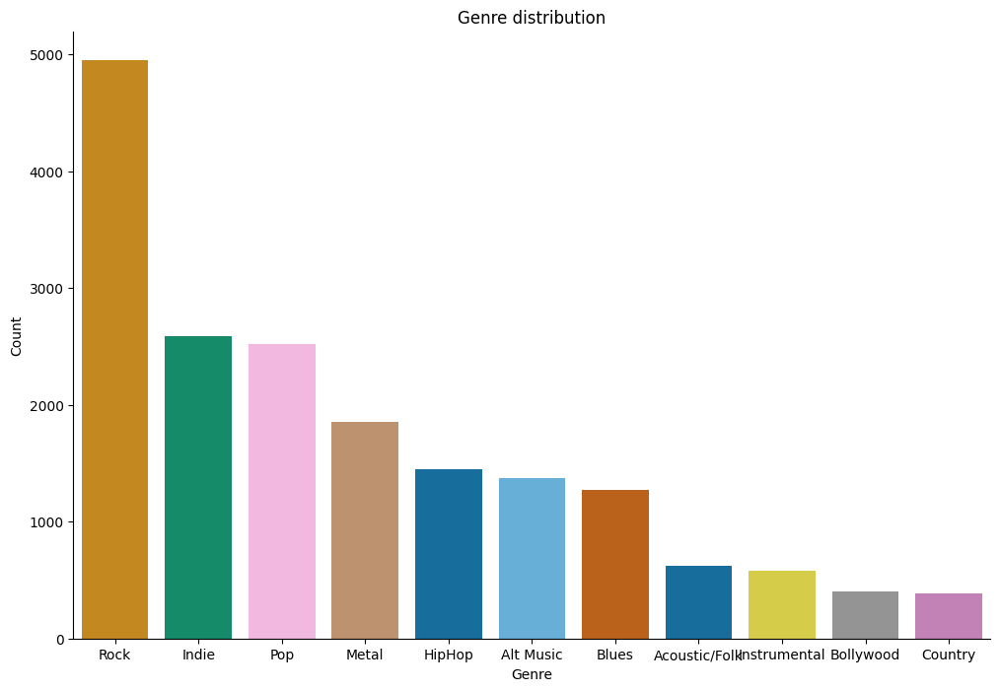

In [35]:
#Graph to understand the distribution of the classes

plt.figure(figsize=(12, 8))
sns.countplot(data=train_data, x=train_data.Genre, hue=train_data.Genre ,palette='colorblind', order = train_data['Genre'].value_counts().index)

plt.title('Genre distribution')
plt.xlabel('Genre')
plt.ylabel('Count')
sns.despine()
plt.show()


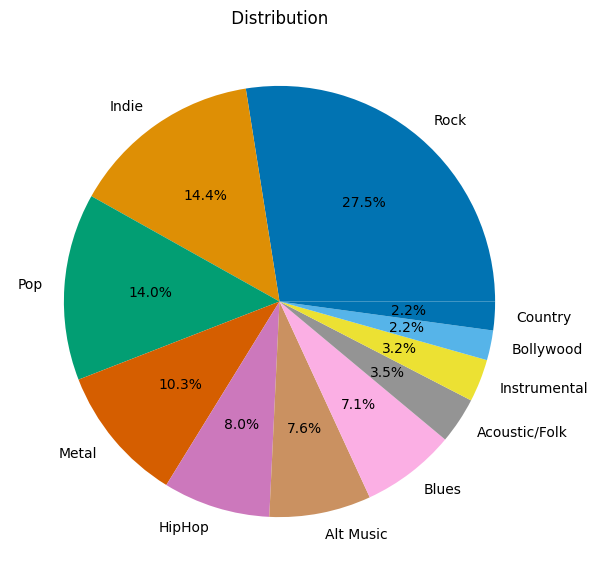

In [36]:
plt.figure(figsize=(7, 7))
Genre_counts = train_data['Genre'].value_counts()
plt.pie(Genre_counts, labels=Genre_counts.index, autopct='%1.1f%%',colors=sns.color_palette('colorblind'))
plt.title(' Distribution ')

plt.show()

### Features Boxplots

C:\Users\Luca\AppData\Local\Temp\ipykernel_18664\2613358794.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
C:\Users\Luca\AppData\Local\Temp\ipykernel_18664\2613358794.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
C:\Users\Luca\AppData\Local\Temp\ipykernel_18664\2613358794.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
C:\Users\Luca\AppData\Local\Temp\ipykernel_18664\2613358794.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
C:\Users\Luca\AppData\Local\Temp\ipykernel_18664\2613358794.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabe

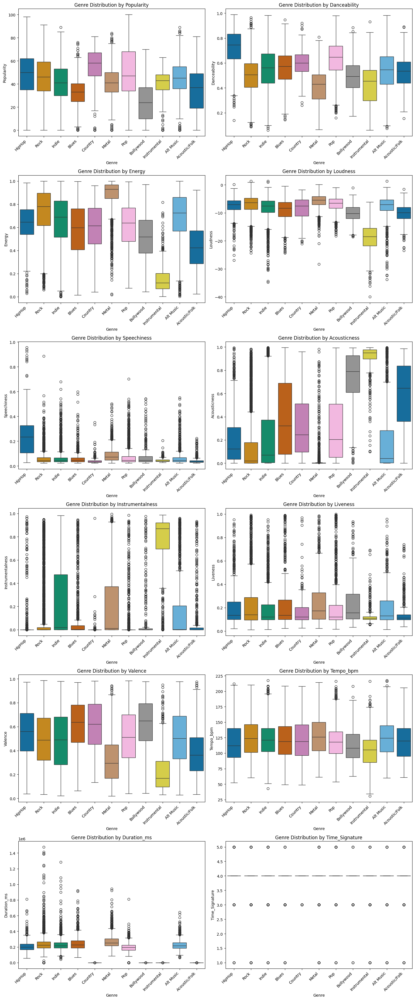

In [16]:
num_rows = len(numeric_features_array) // 2
num_cols = 2 if len(numeric_features_array) > 1 else 1

# Creazione della figura principale
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 6 * num_rows))

# Iterazione sugli indici numerici delle features
for i, ax in enumerate(axes.flatten()):
    # Verifica se si tratta dell'ultimo subplot in caso di numero dispari di features
    if i < len(numeric_features_array):
        sns.boxplot(x='Genre', y=numeric_features_array[i], data=train_data, hue=train_data.Genre, palette='colorblind', ax=ax)
        ax.set_xlabel('Genre')
        ax.set_ylabel(numeric_features_array[i])
        ax.set_title('Genre Distribution by ' + numeric_features_array[i])
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

# Layout automatico per evitare sovrapposizioni
plt.tight_layout()
plt.show()

### Feature Correlation Heatmap

<Axes: >

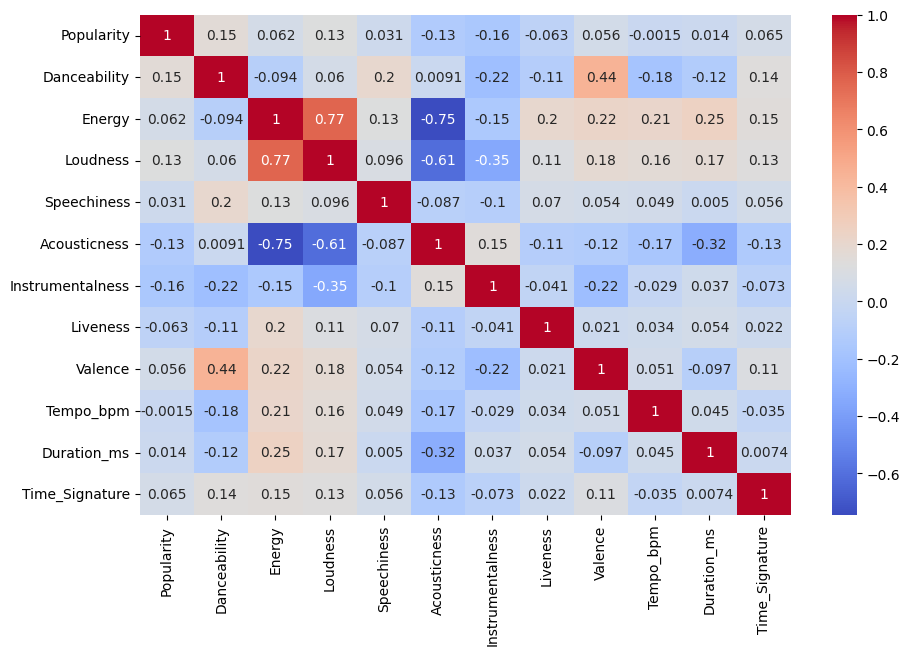

In [39]:
fig, ax = plt.subplots(figsize=(10.5, 6.5))
sns.heatmap(train_data.drop(['Class','Genre'], axis=1).corr(numeric_only=True), annot=True,cmap='coolwarm',ax=ax)

### Correlations between Features and Class

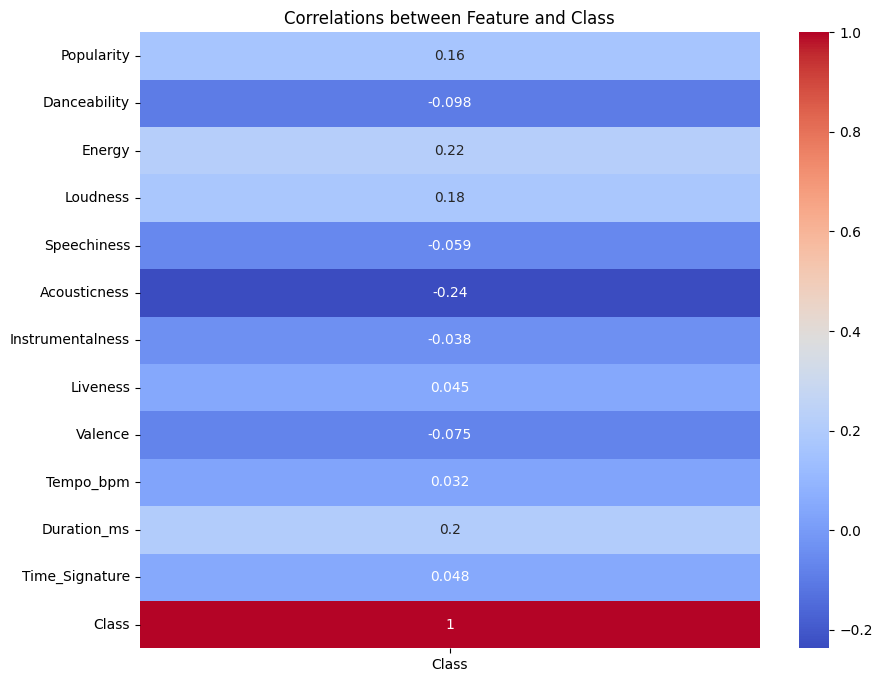

In [45]:
corr_matrix = train_data.corr(numeric_only=True)

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix[['Class']] , annot=True, cmap='coolwarm')
plt.title('Correlations between Feature and Class')
plt.show()

### Pair plot

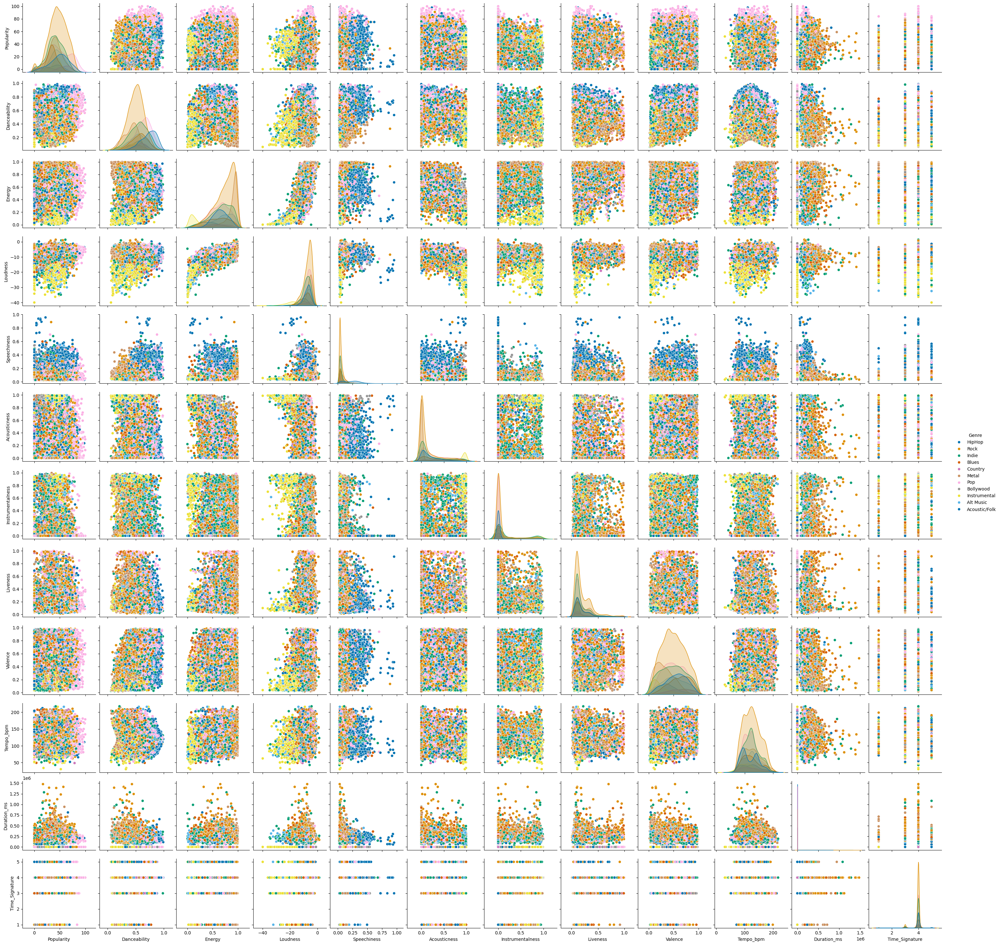

In [77]:
sns.pairplot(train_data, hue='Genre', palette='colorblind')

### ScatterPlot Energy vs Loudness

<Axes: xlabel='Energy', ylabel='Loudness'>

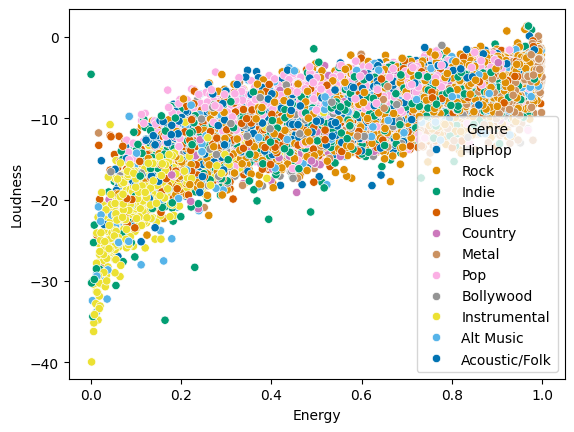

In [49]:
sns.scatterplot(data=train_data, x='Energy', y='Loudness', hue='Genre', palette='colorblind')

C:\Users\Luca\AppData\Local\Temp\ipykernel_19244\3941918653.py:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  avg_data = train_data.groupby('Genre').mean().reset_index()


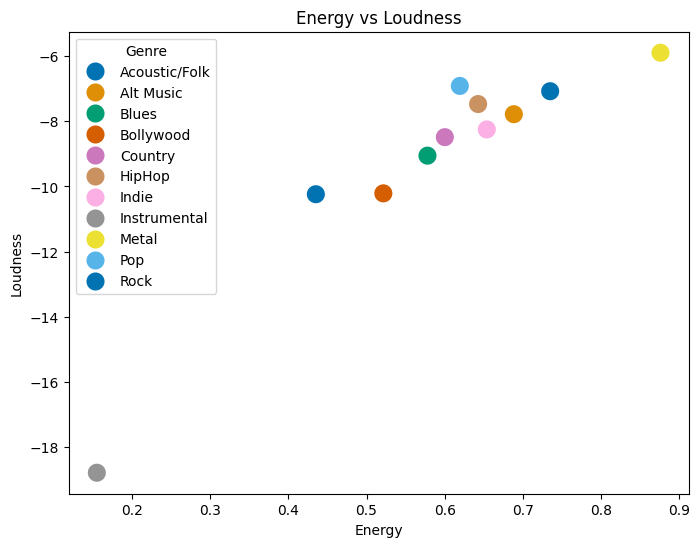

In [17]:
#make sns scatterplot with the average of the energy and loudness for each genre

avg_data = train_data.groupby('Genre').mean().reset_index()
plt.figure(figsize=(8, 6))
sns.scatterplot(data=avg_data, x='Energy', y='Loudness', hue='Genre', palette='colorblind', s=200)
plt.title('Energy vs Loudness')
plt.xlabel('Energy')
plt.ylabel('Loudness')
plt.show()
